## **Environment Setup**

In [1]:
import keras
keras.__version__

Using TensorFlow backend.


'2.0.3'

## **Importing Libraries**

In [1]:
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import patches

from glob import glob

import xml.etree.ElementTree as ET

## **Generate train.csv**

In [3]:
annotations = glob('BCCD_Dataset/BCCD/Annotations/*.xml')

df = []
cnt = 0

for file in annotations:

    filename = file.split('/')[-1]
    filename = filename.split('.')[0] + '.jpg'
    row = []
    parsedXML = ET.parse(file)

    for node in parsedXML.getroot().iter('object'):

        blood_cells = node.find('name').text
        
        xmin = int(node.find('bndbox/xmin').text)
        xmax = int(node.find('bndbox/xmax').text)
        ymin = int(node.find('bndbox/ymin').text)
        ymax = int(node.find('bndbox/ymax').text)

        row = [filename, blood_cells, xmin, xmax, ymin, ymax]
        df.append(row)
        cnt += 1

data = pd.DataFrame(df, columns=['filename', 'cell_type', 'xmin', 'xmax', 'ymin', 'ymax'])
data[['filename', 'cell_type', 'xmin', 'xmax', 'ymin', 'ymax']].to_csv('train.csv', index=False)
data.head()

,filename,cell_type,xmin,xmax,ymin,ymax
0,BloodImage_00277.jpg,RBC,74,179,301,404
1,BloodImage_00277.jpg,RBC,204,283,332,402
2,BloodImage_00277.jpg,RBC,1,69,259,369
3,BloodImage_00277.jpg,RBC,215,308,134,215
4,BloodImage_00277.jpg,RBC,364,472,1,83


## **Load CSV**

In [4]:
train = pd.read_csv('train.csv')
train.head()

,filename,cell_type,xmin,xmax,ymin,ymax
0,BloodImage_00277.jpg,RBC,74,179,301,404
1,BloodImage_00277.jpg,RBC,204,283,332,402
2,BloodImage_00277.jpg,RBC,1,69,259,369
3,BloodImage_00277.jpg,RBC,215,308,134,215
4,BloodImage_00277.jpg,RBC,364,472,1,83


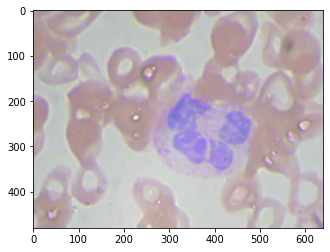

In [5]:
image = plt.imread('BCCD_Dataset/BCCD/JPEGImages/BloodImage_00000.jpg')
plt.imshow(image)

In [6]:
train['filename'].nunique()

364

In [7]:
train['cell_type'].value_counts()

RBC          4155
WBC           372
Platelets     361
Name: cell_type, dtype: int64

## **Visualize Example Output Image**

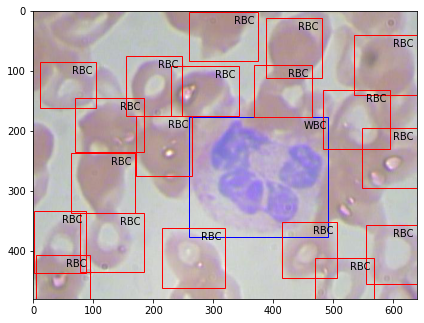

In [8]:
fig = plt.figure()

ax = fig.add_axes([0,0,1,1])

image = plt.imread('BCCD_Dataset/BCCD/JPEGImages/BloodImage_00000.jpg')
plt.imshow(image)

for _,row in train[train.filename == "BloodImage_00000.jpg"].iterrows():
    xmin = row.xmin
    xmax = row.xmax
    ymin = row.ymin
    ymax = row.ymax
    
    width = xmax - xmin
    height = ymax - ymin
    
    if row.cell_type == 'RBC':
        edgecolor = 'r'
        ax.annotate('RBC', xy=(xmax-40,ymin+20))
    elif row.cell_type == 'WBC':
        edgecolor = 'b'
        ax.annotate('WBC', xy=(xmax-40,ymin+20))
    elif row.cell_type == 'Platelets':
        edgecolor = 'g'
        ax.annotate('Platelets', xy=(xmax-40,ymin+20))
        
    rect = patches.Rectangle((xmin,ymin), width, height, edgecolor = edgecolor, facecolor = 'none')
    
    ax.add_patch(rect)

## **Implementening Faster RCNN**

In [9]:
# Creating Text File for Training Model

data = pd.DataFrame()
data['format'] = train['filename']

# as the images are in train_images folder, add train_images before the image name
for i in range(data.shape[0]):
    data['format'][i] = 'BCCD_Dataset/BCCD/JPEGImages/' + data['format'][i]

# add xmin, ymin, xmax, ymax and class as per the format required
for i in range(data.shape[0]):
    data['format'][i] = data['format'][i] + ',' + str(train['xmin'][i]) + ',' + str(train['ymin'][i]) + ',' + str(train['xmax'][i]) + ',' + str(train['ymax'][i]) + ',' + train['cell_type'][i]

data.to_csv('annotate.txt', header=None, index=None, sep=' ')

In [10]:
# Train the Model

! python keras-frcnn/train_frcnn.py -o simple -p annotate.txt

Using TensorFlow backend.
Parsing annotation files
Parsing annotation files
Training images per class:
{'Platelets': 361, 'RBC': 4155, 'WBC': 372, 'bg': 0}
Num classes (including bg) = 4
Config has been written to config.pickle, and can be loaded when testing to ensure correct results
Num train samples 364
Num val samples 364






Instructions for updating:
keep_dims is deprecated, use keepdims instead
loading weights from {C.base_net_weights}
Could not load pretrained model weights. Weights can be found in the keras application folder 		https://github.com/fchollet/keras/tree/master/keras/applications


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
keep_dims is deprecated, use keepdims instead
Starting training
Epoch 1/20

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor




2021-10-12 09:17:31.334490: I tensorflow/core/platform/cpu_feature_gu

In [3]:
! python keras-frcnn/test_frcnn.py -p BCCD_Dataset/BCCD/JPEGImages

Using TensorFlow backend.


2021-10-12 11:30:01.033665: I tensorflow/core/platform/cpu_feature_guard.cc:142] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2021-10-12 11:30:01.063361: I tensorflow/core/platform/profile_utils/cpu_utils.cc:94] CPU Frequency: 2096815000 Hz
2021-10-12 11:30:01.064656: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x561870ffeda0 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2021-10-12 11:30:01.064716: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Host, Default Version
2021-10-12 11:30:01.077906: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2021-10-12 11:30:01.271467: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


## **Own Dataset**

In [9]:
! python keras-frcnn/test_frcnn.py -p Blood-Cell-Data/images

Using TensorFlow backend.


2021-10-12 16:47:28.699865: I tensorflow/core/platform/cpu_feature_guard.cc:142] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2021-10-12 16:47:28.735682: I tensorflow/core/platform/profile_utils/cpu_utils.cc:94] CPU Frequency: 2096815000 Hz
2021-10-12 16:47:28.737052: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x55afcab942e0 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2021-10-12 16:47:28.737118: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Host, Default Version
2021-10-12 16:47:28.748871: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2021-10-12 16:47:28.928619: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:983] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


In [10]:
results = pd.read_csv('result.csv')
results

,Unnamed: 0,image,xmin,ymin,xmax,ymax,label
0,0,image-1.png,98,49,167,98,WBC
1,1,image-1.png,128,29,177,78,WBC
2,2,image-1.png,118,39,177,108,WBC
3,3,image-1.png,88,29,147,88,WBC
4,4,image-1.png,88,49,137,98,WBC
...,...,...,...,...,...,...,...
446,446,image-97.png,78,98,147,147,WBC
447,447,image-97.png,196,29,246,88,RBC
448,448,image-97.png,128,29,177,78,RBC
449,449,image-99.png,98,9,167,78,WBC
